In [1]:
import pickle
from matplotlib import pyplot as plt
import numpy as np

In [2]:
from matplotlib import font_manager

font_dirs = ['/scratch4/jgray21/dxu39/miniforge3/envs/diffenergy/fonts']
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

# set font
plt.rcParams['font.family'] = 'Arial'
plt.rcParams["mathtext.fontset"] = 'cm'

In [3]:
with open('/home/dxu39/scr4_jgray21/dxu39/projects/diffenergy/dfmdock_perturb_tr_likelihood/dfmdock_perturb_tr_likelihood_all.pkl', 'rb') as f:
    results = pickle.load(f)

In [4]:
with open('/home/dxu39/scr4_jgray21/dxu39/projects/diffenergy/dfmdock_perturb_tr_likelihood/dfmdock_perturb_tr_likelihood_gt.pkl', 'rb') as f:
    gt_results = pickle.load(f)

In [5]:
unique_ids = list(results.keys())
unique_ids.sort()

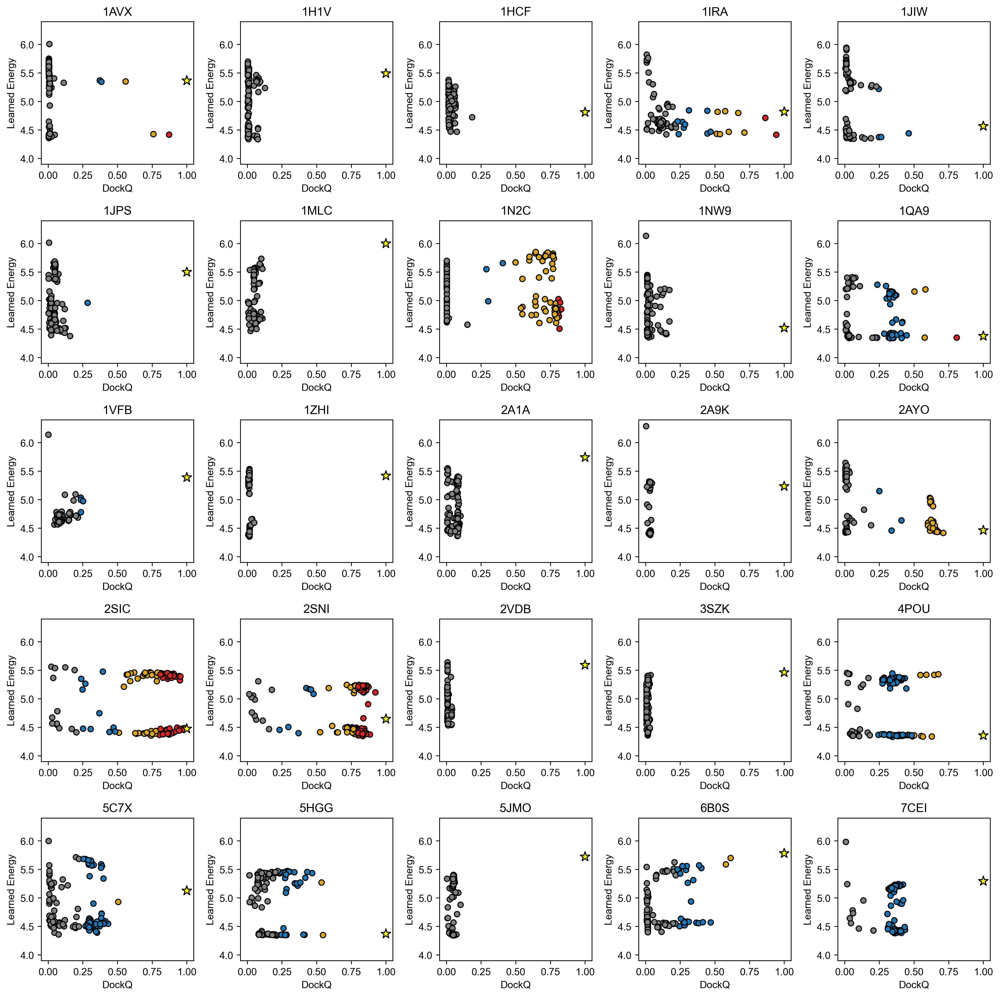

In [6]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.scatter(1.0, gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
    ax.set_title(_id)
    ax.set_xlabel('DockQ')
    ax.set_ylabel('Learned Energy')
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(3.9, 6.4)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('flowtime_v_dockq_all.png', dpi=300, bbox_inches='tight')

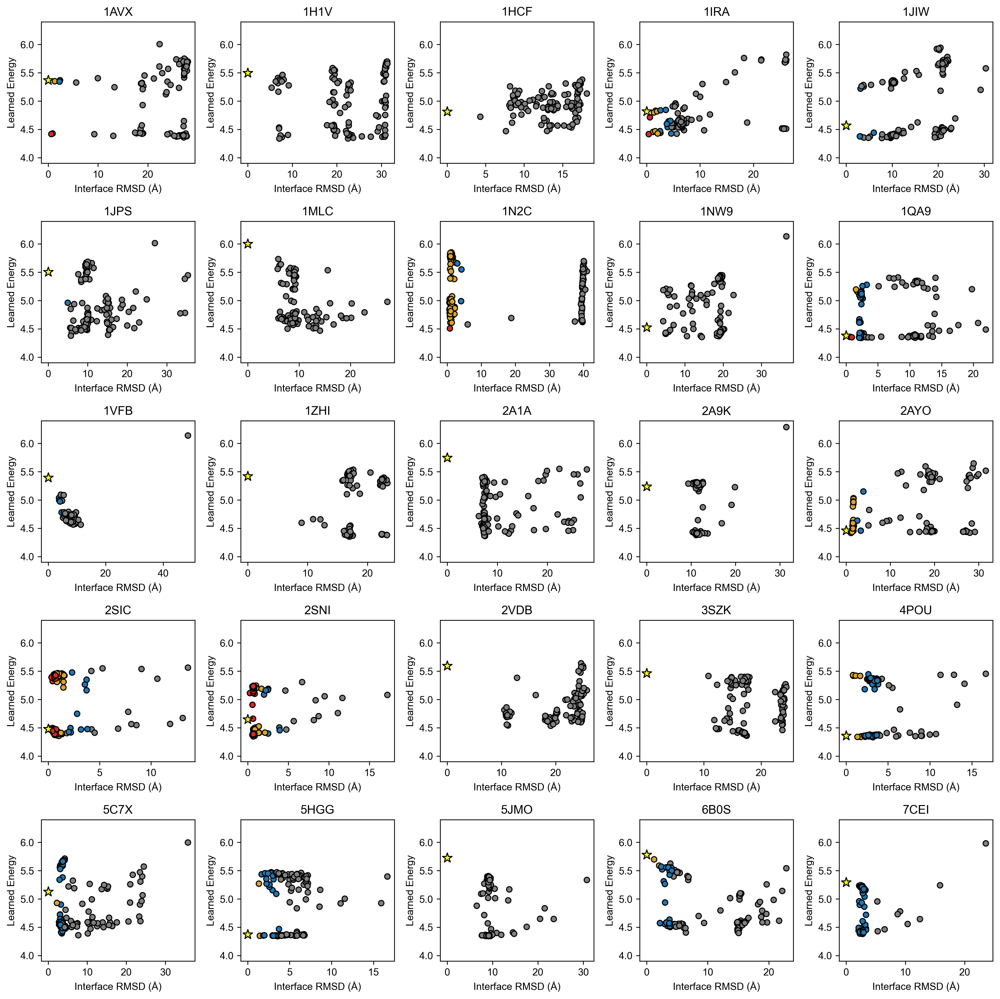

In [7]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['i_rmsd'] < 100) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.scatter(0.0, gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
    ax.set_title(_id)
    ax.set_xlabel('Interface RMSD (Å)')
    ax.set_ylabel('Learned Energy')
    ax.set_ylim(3.9, 6.4)
    xsta, xend = ax.get_xlim()
    ax.set_xlim(min(xsta, -0.2), max(xend, 5.0))
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('flowtime_v_rmsd_all.png', dpi=300, bbox_inches='tight')

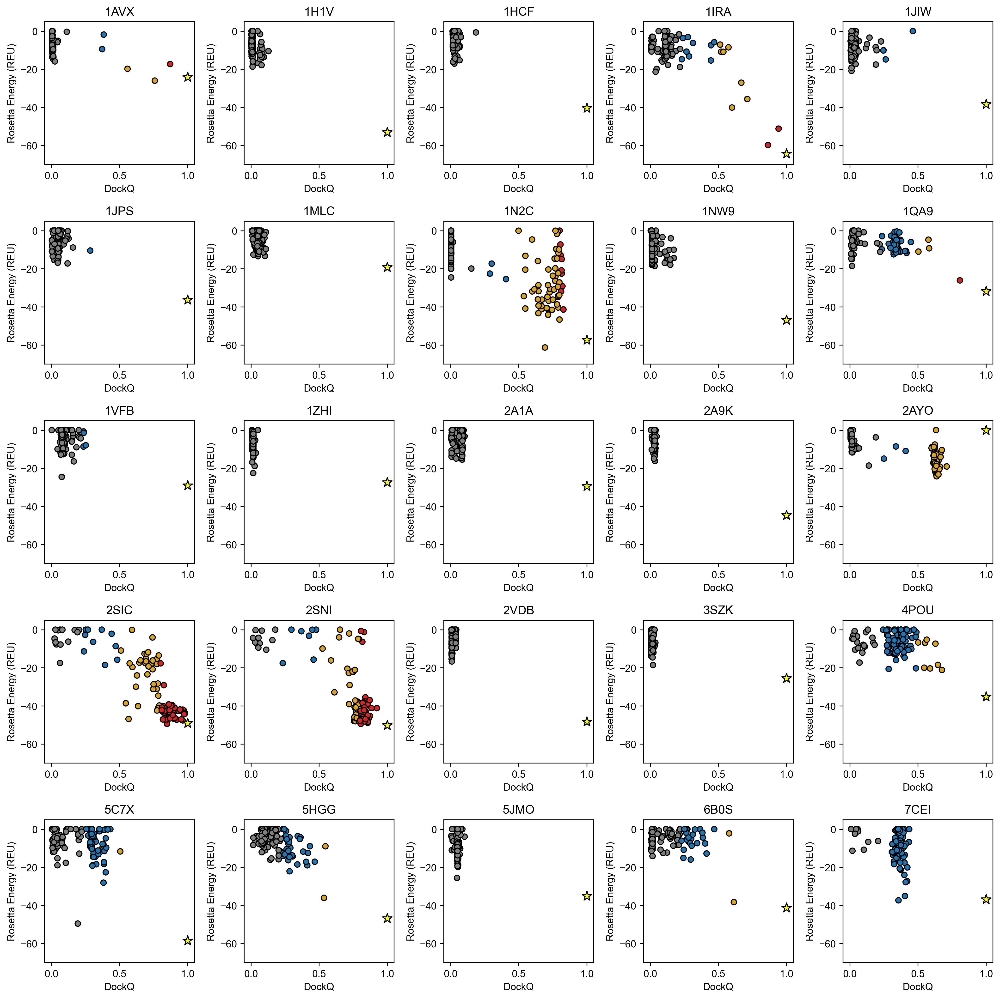

In [8]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.scatter(1.0, gt_results['rosetta'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
    ax.set_title(_id)
    ax.set_xlabel('DockQ')
    ax.set_ylabel('Rosetta Energy (REU)')
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-70, 5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('rosetta_v_dockq_all.png', dpi=300, bbox_inches='tight')

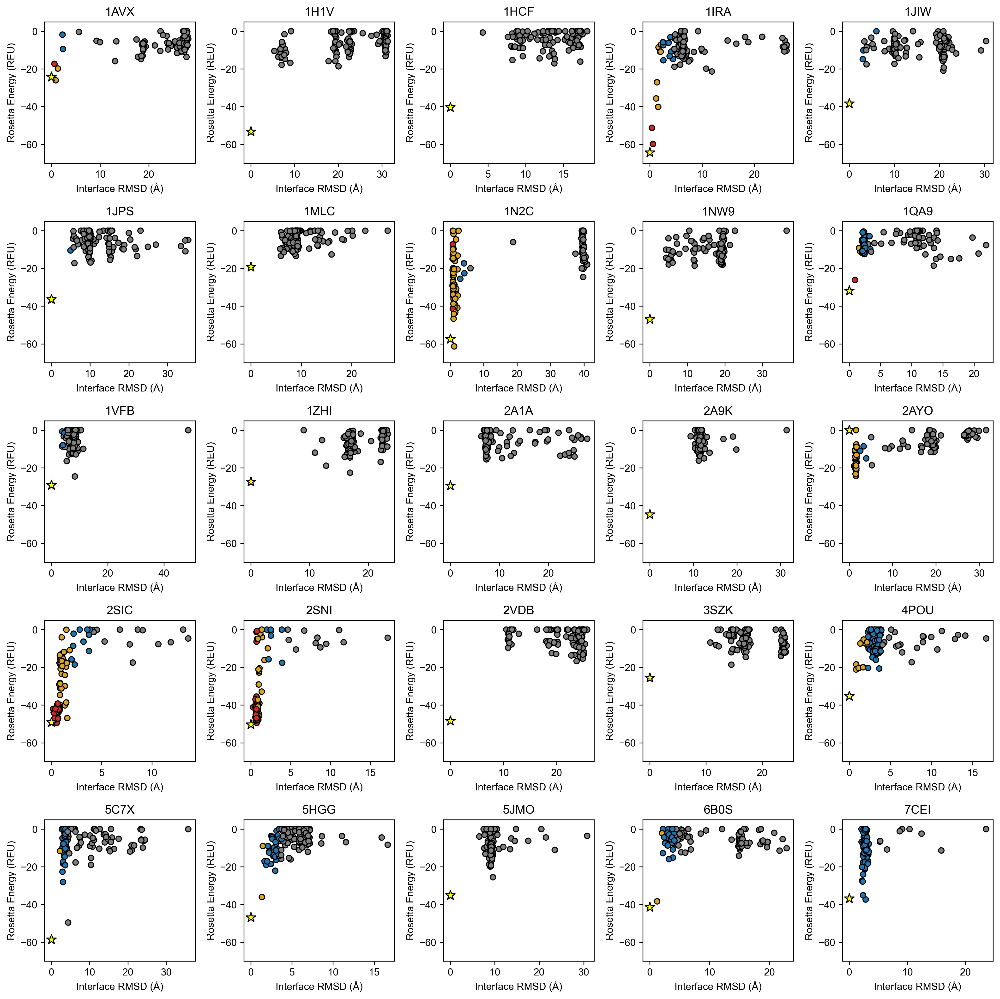

In [9]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['i_rmsd'] < 100) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.scatter(0.0, gt_results['rosetta'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
    ax.set_title(_id)
    ax.set_xlabel('Interface RMSD (Å)')
    ax.set_ylabel('Rosetta Energy (REU)')
    ax.set_ylim(-70, 5)
    xsta, xend = ax.get_xlim()
    ax.set_xlim(min(xsta, -0.2), max(xend, 5.0))
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('rosetta_v_rmsd_all.png', dpi=300, bbox_inches='tight')

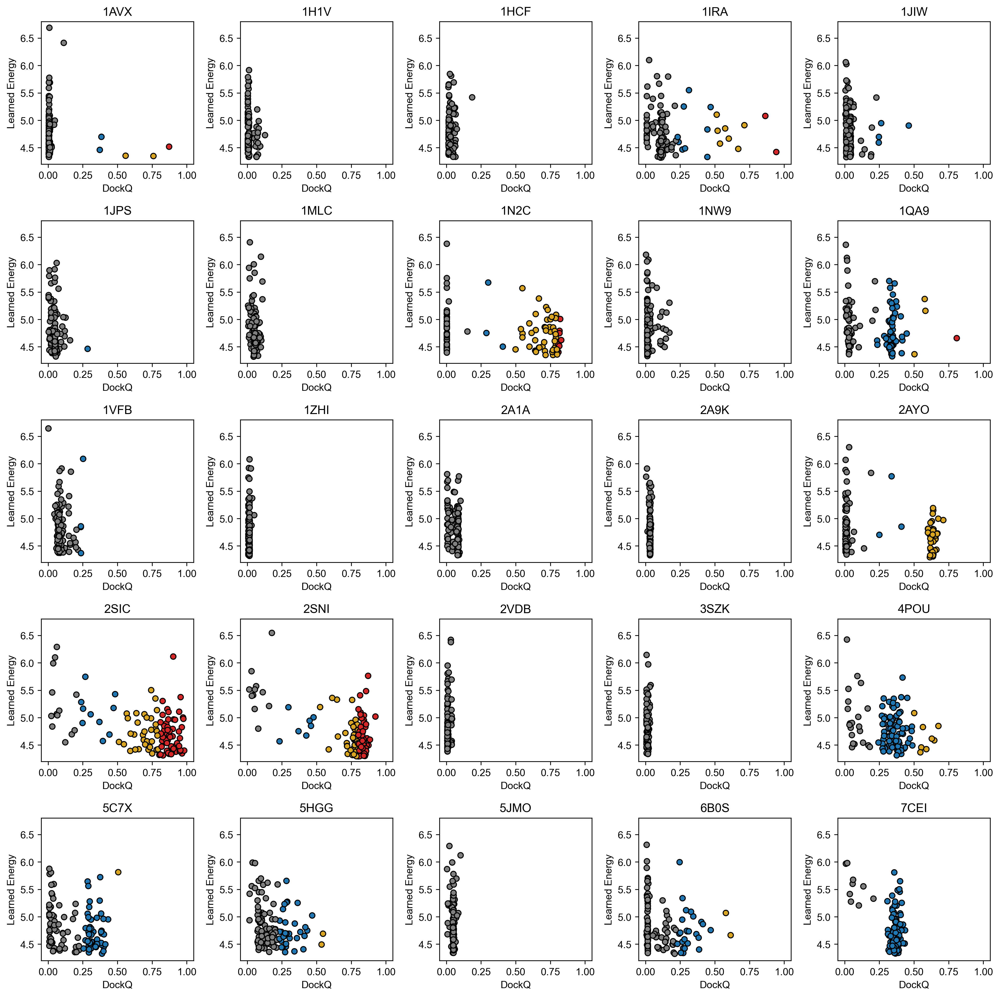

In [10]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['difftime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.set_title(_id)
    ax.set_xlabel('DockQ')
    ax.set_ylabel('Learned Energy')
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(4.2, 6.8)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('difftime_v_dockq_all.png', dpi=300, bbox_inches='tight')

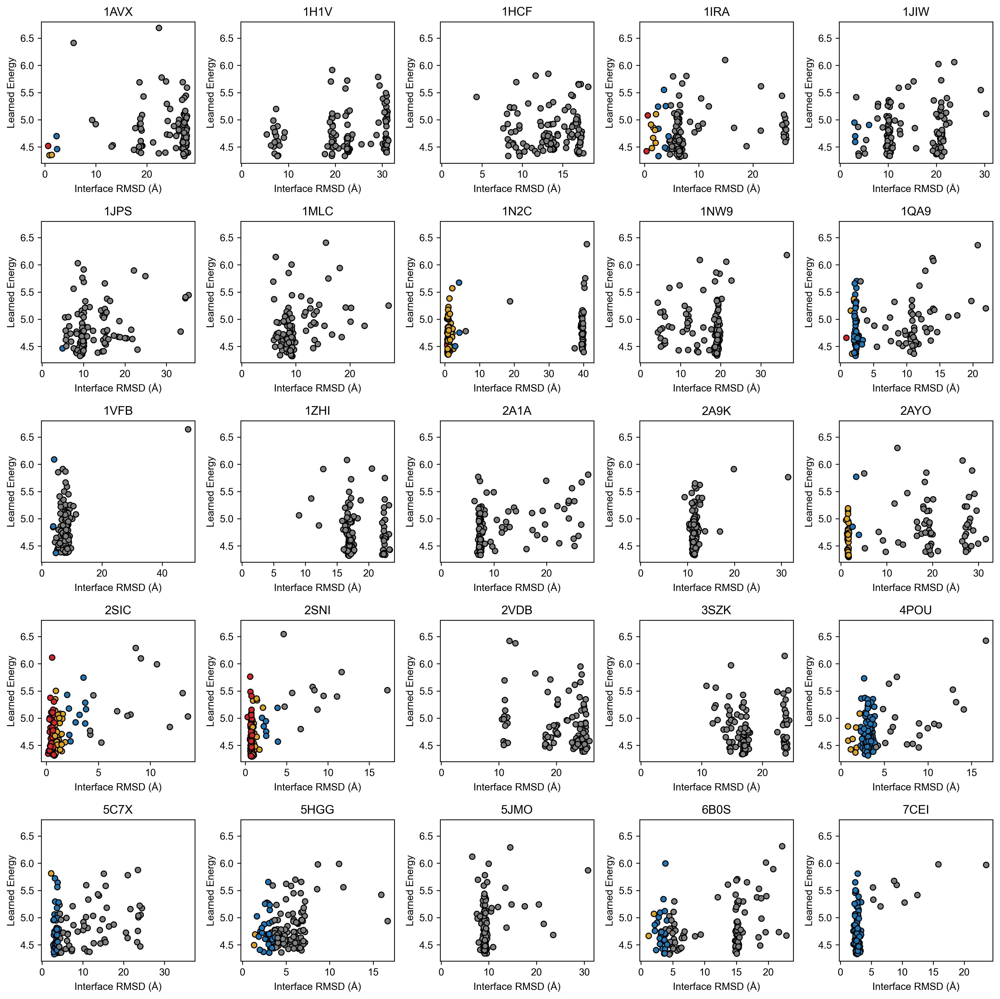

In [11]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['i_rmsd'] < 100) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['difftime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.set_title(_id)
    ax.set_xlabel('Interface RMSD (Å)')
    ax.set_ylabel('Learned Energy')
    ax.set_ylim(4.2, 6.8)
    xsta, xend = ax.get_xlim()
    ax.set_xlim(min(xsta, -0.2), max(xend, 5.0))
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('difftime_v_rmsd_all.png', dpi=300, bbox_inches='tight')

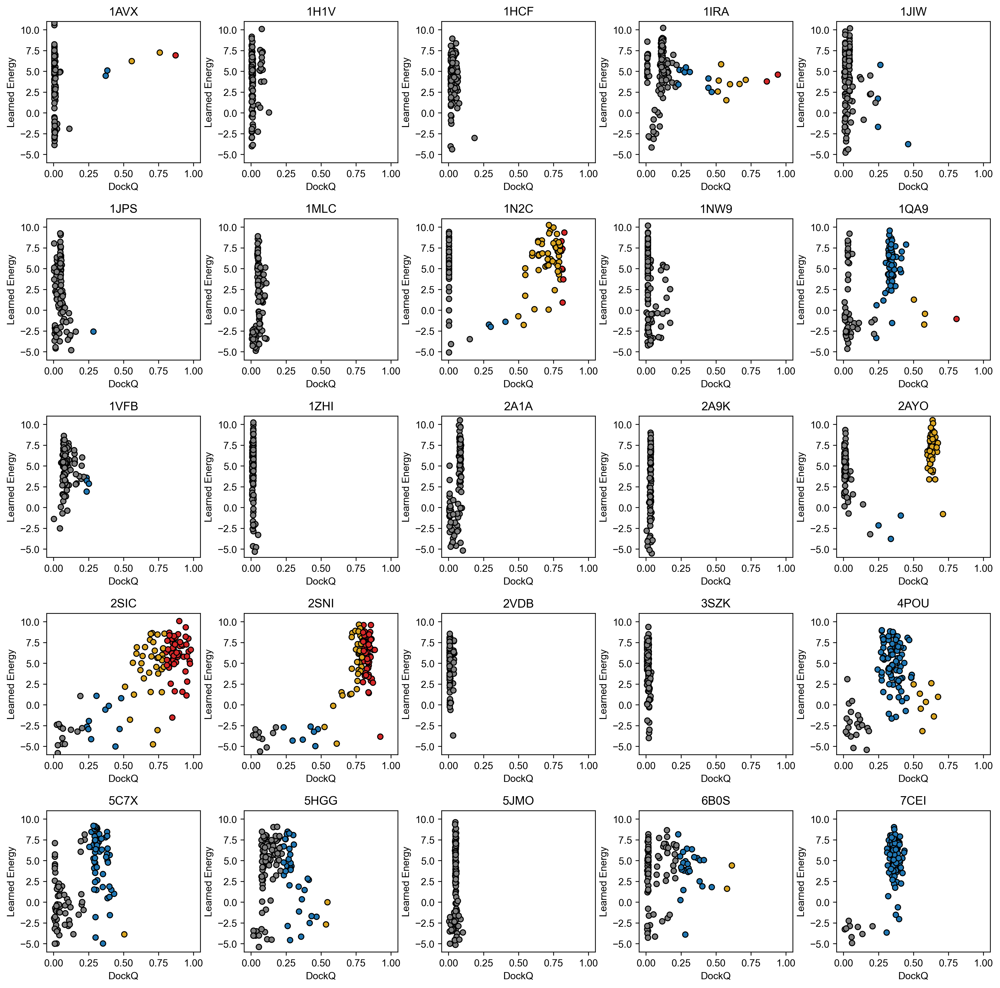

In [12]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['diffspace_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.set_title(_id)
    ax.set_xlabel('DockQ')
    ax.set_ylabel('Learned Energy')
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-6, 11)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('diffspace_v_dockq_all.png', dpi=300, bbox_inches='tight')

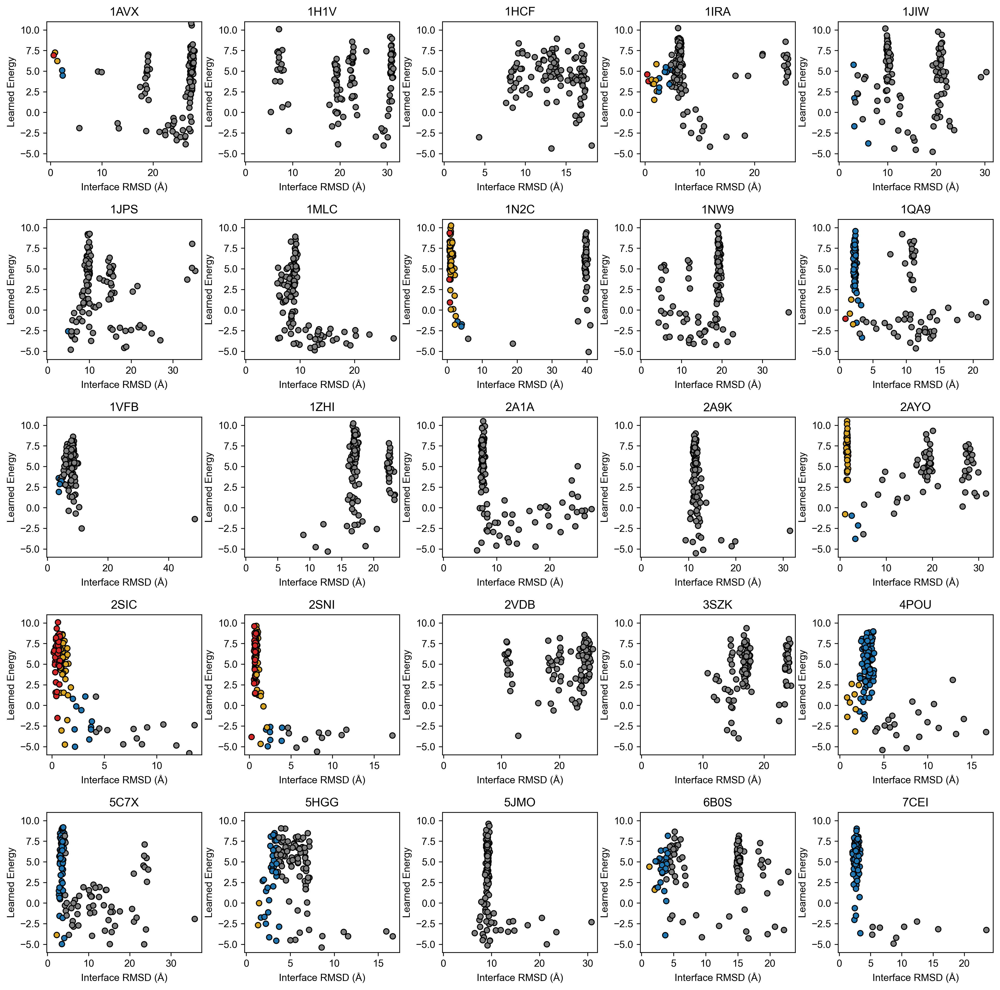

In [13]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['i_rmsd'] < 100) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['diffspace_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
    ax.set_title(_id)
    ax.set_xlabel('Interface RMSD (Å)')
    ax.set_ylabel('Learned Energy')
    ax.set_ylim(-6, 11)
    xsta, xend = ax.get_xlim()
    ax.set_xlim(min(xsta, -0.2), max(xend, 5.0))
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('diffspace_v_rmsd_all.png', dpi=300, bbox_inches='tight')

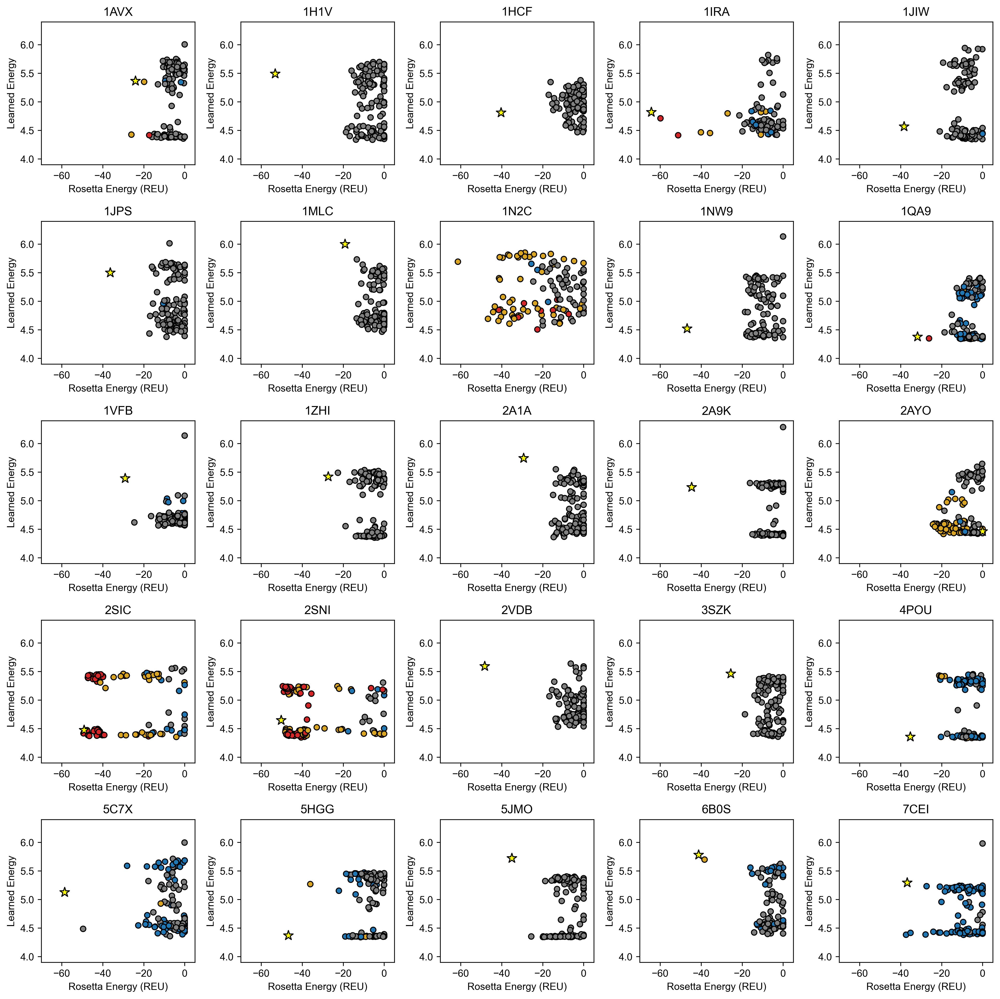

In [14]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['rosetta_Isc'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors)
    ax.scatter(gt_results['rosetta'][_id], gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
    ax.set_title(_id)
    ax.set_xlabel('Rosetta Energy (REU)')
    ax.set_ylabel('Learned Energy')
    ax.set_ylim(3.9, 6.4)
    ax.set_xlim(-70, 5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('flowtime_v_rosetta_all.png', dpi=300, bbox_inches='tight')

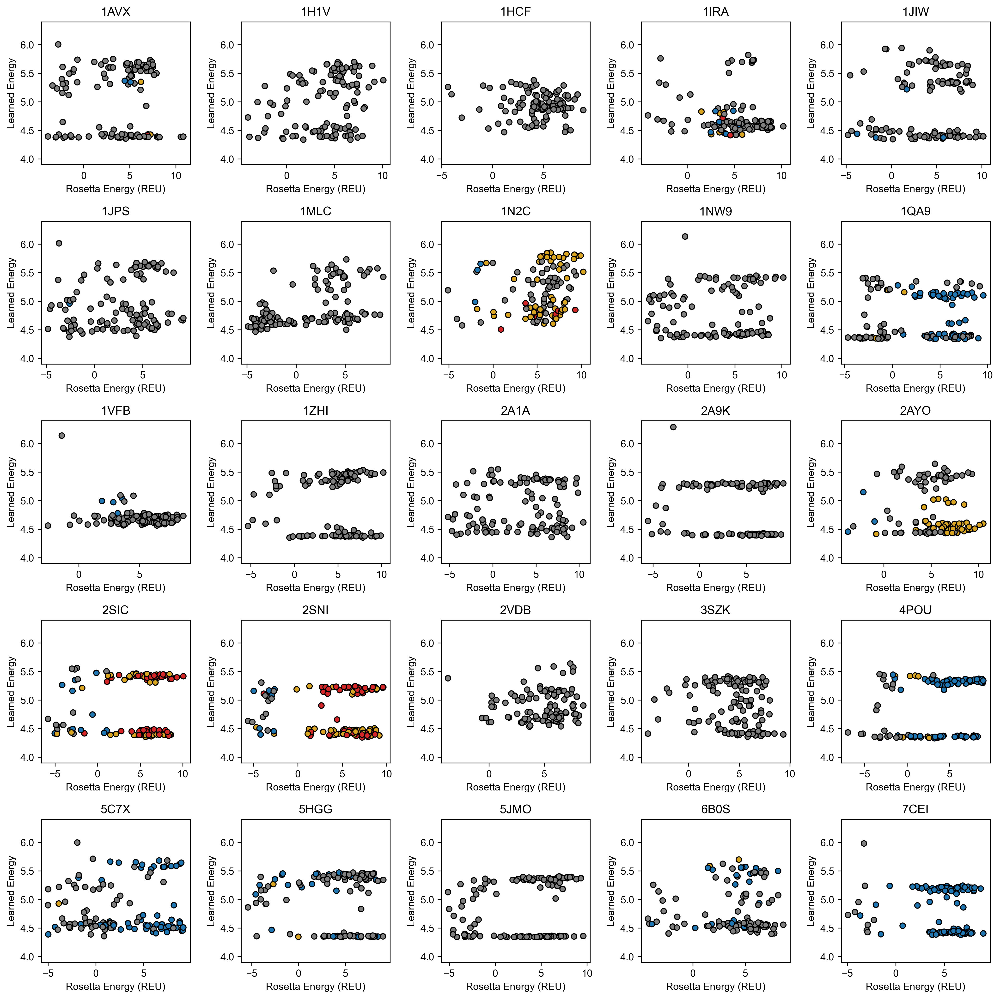

In [15]:
fig, axes = plt.subplots(5, 5, figsize=(14, 14))
for i, _id in enumerate(unique_ids):
    ax = axes[i // 5, i % 5]
    idx_to_keep = (results[_id]['rosetta_Isc'] > -10000) & (results[_id]['flowtime_nll'] < 6.4)
    colors = ['gray' if dockq < 0.23 
              else 'tab:blue' if dockq < 0.49
              else 'goldenrod' if dockq < 0.80
              else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
    ax.scatter(results[_id]['diffspace_nll'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors)
    # ax.scatter(gt_results['rosetta'][_id], gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
    ax.set_title(_id)
    ax.set_xlabel('Rosetta Energy (REU)')
    ax.set_ylabel('Learned Energy')
    ax.set_ylim(3.9, 6.4)
    # ax.set_xlim(-70, 5)
plt.tight_layout()
fig.set_dpi(300)
# plt.savefig('flowtime_v_rosetta_all.png', dpi=300, bbox_inches='tight')

In [16]:
min_dockq_nll = {}
min_dockq_rosetta = {}
max_dockq_oracle = {}
for i, _id in enumerate(unique_ids):
    idx_to_keep = results[_id]['rosetta_Isc'] > -10000
    min_nll_idx = np.argmin(results[_id]['flowtime_nll'][idx_to_keep])
    min_dockq_nll[_id] = results[_id]['dockq'][idx_to_keep][min_nll_idx]
    min_rosetta_idx = np.argmin(results[_id]['rosetta_Isc'][idx_to_keep])
    min_dockq_rosetta[_id] = results[_id]['dockq'][idx_to_keep][min_rosetta_idx]
    max_dockq_oracle[_id] = np.max(results[_id]['dockq'][idx_to_keep])

In [17]:
idx_to_keep = results['2SIC']['rosetta_Isc'] > -10000
np.argmin(results['2SIC']['rosetta_Isc'][idx_to_keep])

5

In [18]:
results['2SIC']['rosetta_Isc']

array([  0.   ,  -4.676, -23.471, -11.405, -45.532, -49.383, -47.232,
       -47.067, -42.558, -47.607, -41.836,   0.   , -47.093, -42.931,
       -40.102, -42.487, -17.479, -18.049, -29.133, -17.67 , -40.924,
        -0.322,  -7.709, -46.318, -31.074, -29.922, -46.713, -40.148,
       -17.307, -42.078, -42.41 ,  -4.071,   0.   , -41.032, -19.232,
        -6.379,   0.   , -41.932, -15.159, -47.141, -46.324, -42.729,
       -17.759, -16.081, -28.262,  -0.22 ,  -2.704, -39.821,   0.   ,
        -7.81 ,  -8.628,  -2.152, -42.777, -12.673, -46.883, -42.478,
        -0.09 ,   0.   , -47.165, -42.434, -41.986, -41.179, -40.368,
       -42.465,  -6.295, -10.948, -41.601, -17.47 , -41.892, -41.998,
       -15.788, -16.19 ,  -1.319, -20.784, -43.477, -34.644, -19.61 ,
         0.   , -41.357, -42.708, -19.276, -40.571, -46.534, -44.744,
       -15.239, -42.431, -42.02 , -42.408, -31.158, -28.659, -43.961,
       -42.969, -18.52 ,  -0.09 , -43.017, -40.95 , -39.598, -41.92 ,
       -42.222, -17.

In [19]:
key_sorted_oracle = list(dict(sorted(max_dockq_oracle.items(), key=lambda x: x[1], reverse=True)).keys())

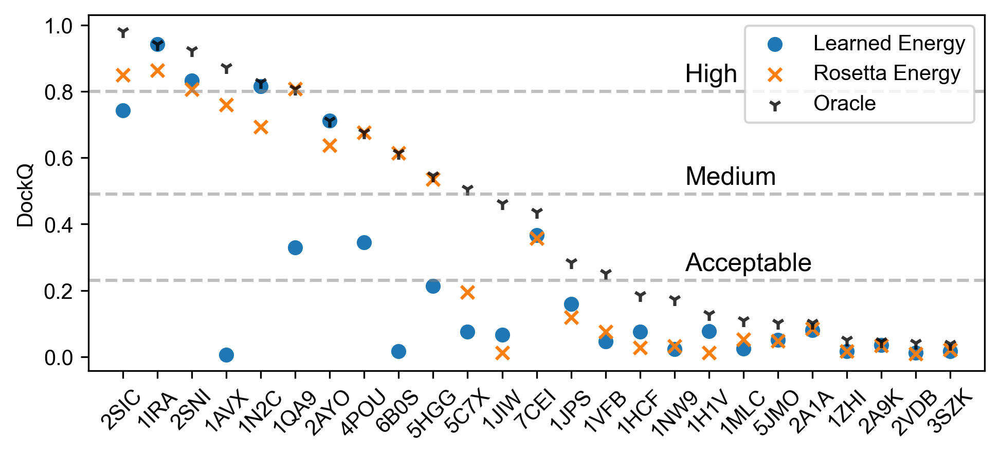

In [20]:
plt.scatter(key_sorted_oracle, [min_dockq_nll[key] for key in key_sorted_oracle], label='Learned Energy')
plt.scatter(key_sorted_oracle, [min_dockq_rosetta[key] for key in key_sorted_oracle], marker='x', label='Rosetta Energy')
plt.scatter(key_sorted_oracle, [max_dockq_oracle[key] for key in key_sorted_oracle], marker="1", c='k', label='Oracle', alpha=0.8)
plt.hlines(0.23, xmin=-1, xmax=25, color='gray', linestyle='--', alpha=0.5)
plt.hlines(0.49, xmin=-1, xmax=25, color='gray', linestyle='--', alpha=0.5)
plt.hlines(0.80, xmin=-1, xmax=25, color='gray', linestyle='--', alpha=0.5)
plt.text(16.3, 0.26, 'Acceptable', fontsize=12)
plt.text(16.3, 0.52, 'Medium', fontsize=12)
plt.text(16.3, 0.83, 'High', fontsize=12)
plt.legend()
plt.ylabel('DockQ')
plt.xlim(-1, 25)
plt.xticks(rotation=45)
fig = plt.gcf()
fig.set_size_inches(7.5, 3)
fig.set_dpi(300)
plt.savefig('top_rank_dockq.png', dpi=300, bbox_inches='tight')

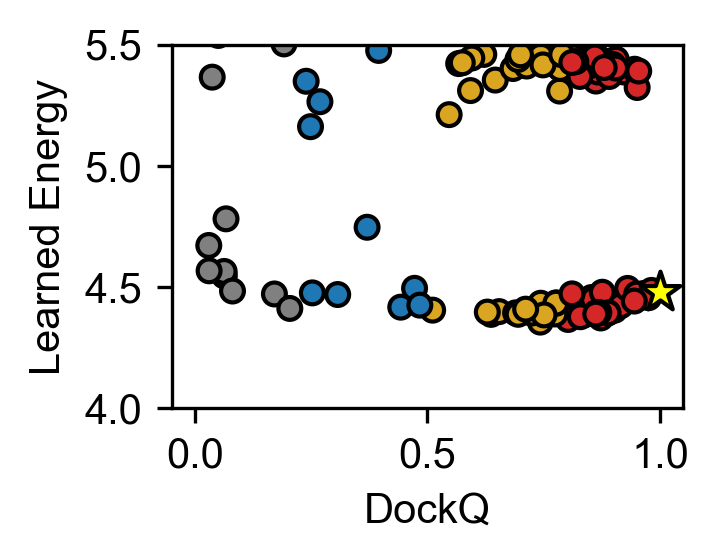

In [21]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(1.0, gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('DockQ')
ax.set_ylabel('Learned Energy')
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(4, 5.5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('2SIC_flowtime_v_dockq.png', dpi=300, bbox_inches='tight')

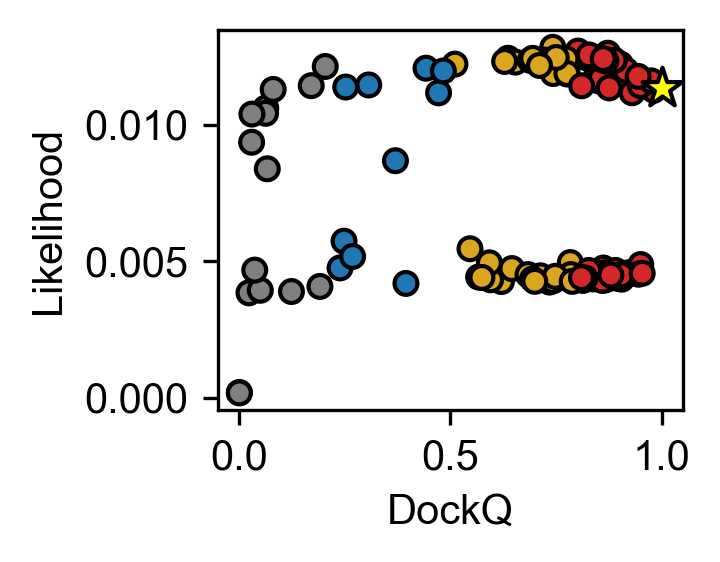

In [22]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['dockq'][idx_to_keep], np.exp(-results[_id]['flowtime_nll'][idx_to_keep]), s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(1.0, np.exp(-gt_results['flowtime'][_id]), s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('DockQ')
ax.set_ylabel('Likelihood')
ax.set_xlim(-0.05, 1.05)
# ax.set_ylim(2.3, 5)
plt.tight_layout()
fig.set_dpi(300)
# plt.savefig('2SIC_flowtime_v_dockq.png', dpi=300, bbox_inches='tight')

In [23]:
lower_dockq = results[_id]['dockq'][idx_to_keep] < 0.80
print(np.mean(results[_id]['flowtime_nll'][idx_to_keep][lower_dockq]))
print(np.std(results[_id]['flowtime_nll'][idx_to_keep][lower_dockq]))
print(gt_results['flowtime'][_id])

5.042696173985799
0.8148633746163793
4.477180004119873


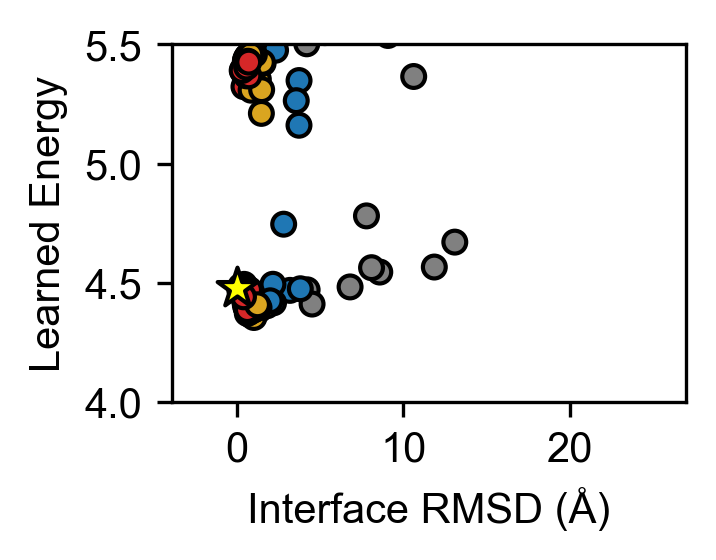

In [24]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(0.0, gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('Interface RMSD (Å)')
ax.set_ylabel('Learned Energy')
# ax.set_ylabel('Learned Energy')
# ax.set_xlim(0, 37)
ax.set_ylim(4, 5.5)
# ax.set_yticks([2.5, 3.0, 3.5, 4.0, 4.5, 5.0])
xsta, xend = ax.get_xlim()
ax.set_xlim(min(xsta, -0.2), 27)
# ax.set_ylim(2.3, 5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('2SIC_flowtime_v_rmsd.png', dpi=300, bbox_inches='tight')

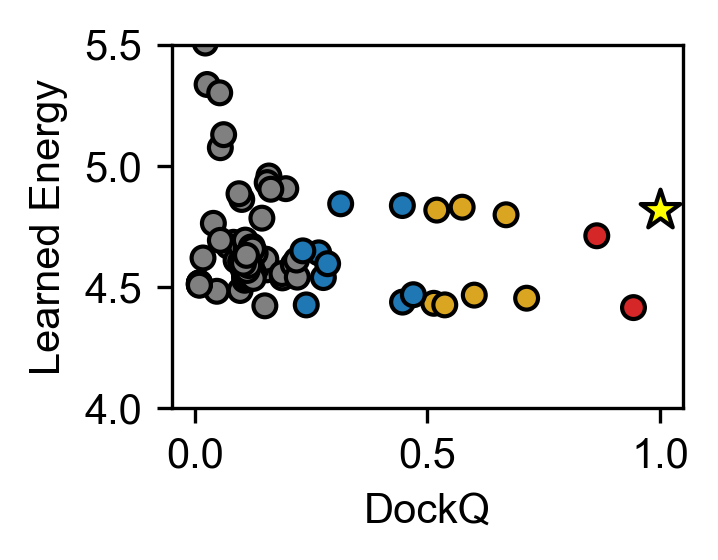

In [25]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '1IRA'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(1.0, gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('DockQ')
ax.set_ylabel('Learned Energy')
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(4, 5.5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('1IRA_flowtime_v_dockq.png', dpi=300, bbox_inches='tight')

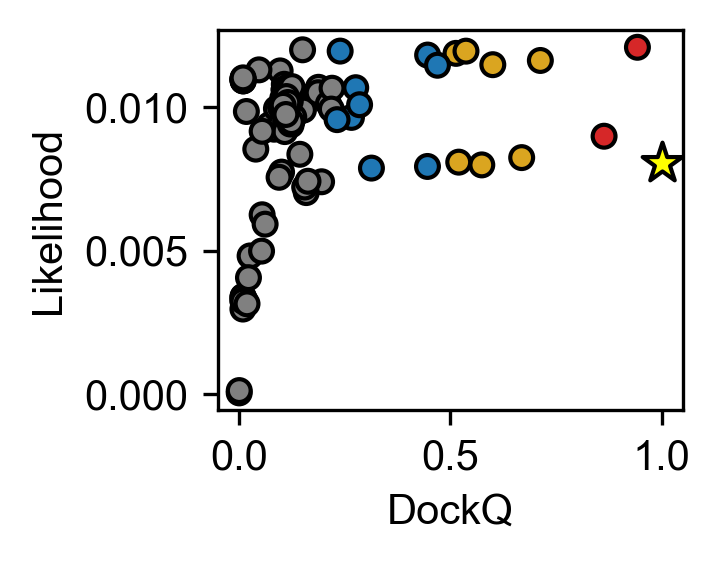

In [26]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '1IRA'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['dockq'][idx_to_keep], np.exp(-results[_id]['flowtime_nll'][idx_to_keep]), s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(1.0, np.exp(-gt_results['flowtime'][_id]), s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('DockQ')
ax.set_ylabel('Likelihood')
ax.set_xlim(-0.05, 1.05)
# ax.set_ylim(2.3, 5)
plt.tight_layout()
fig.set_dpi(300)
# plt.savefig('1IRA_flowtime_v_dockq.png', dpi=300, bbox_inches='tight')

In [27]:
lower_dockq = results[_id]['dockq'][idx_to_keep] < 0.80
print(np.mean(results[_id]['flowtime_nll'][idx_to_keep][lower_dockq]))
print(np.std(results[_id]['flowtime_nll'][idx_to_keep][lower_dockq]))
print(gt_results['flowtime'][_id])

4.8058295896497825
0.7062484270569341
4.818922996520996


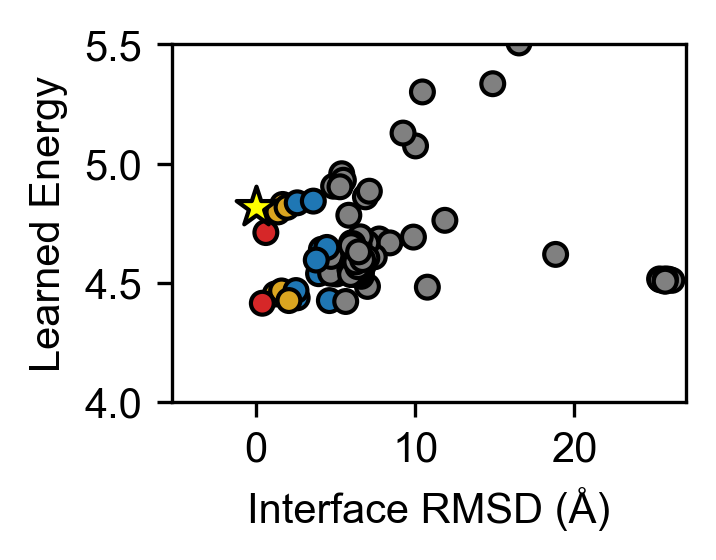

In [28]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '1IRA'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(0.0, gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('Interface RMSD (Å)')
ax.set_ylabel('Learned Energy')
# ax.set_xlim(0, 30)
ax.set_ylim(4, 5.5)
# ax.set_yticks([2.5, 3.0, 3.5, 4.0, 4.5, 5.0])
xsta, xend = ax.get_xlim()
ax.set_xlim(min(xsta, -0.2), 27)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('1IRA_flowtime_v_rmsd.png', dpi=300, bbox_inches='tight')

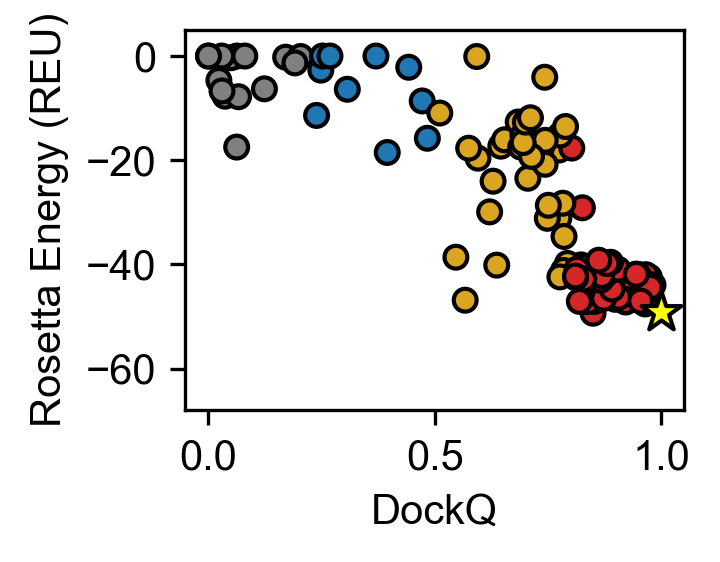

In [29]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(1.0, gt_results['rosetta'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('DockQ')
ax.set_ylabel('Rosetta Energy (REU)')
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-68, 5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('2SIC_rosetta_v_dockq.png', dpi=300, bbox_inches='tight')

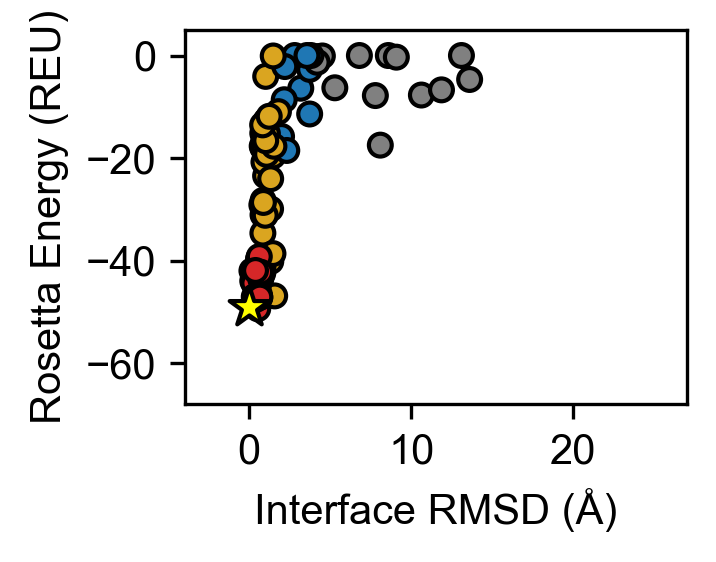

In [30]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(0.0, gt_results['rosetta'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('Interface RMSD (Å)')
ax.set_ylabel('Rosetta Energy (REU)')
# ax.set_xlim(0, 37)
ax.set_ylim(-68, 5)
xsta, xend = ax.get_xlim()
ax.set_xlim(min(xsta, -0.2), 27)
# ax.set_ylim(-55, 5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('2SIC_rosetta_v_rmsd.png', dpi=300, bbox_inches='tight')

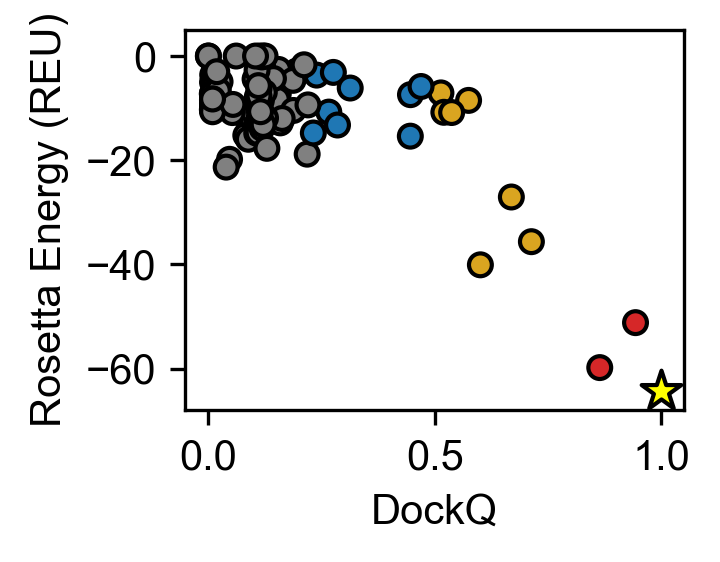

In [31]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '1IRA'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['dockq'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(1.0, gt_results['rosetta'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('DockQ')
ax.set_ylabel('Rosetta Energy (REU)')
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-68, 5)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('1IRA_rosetta_v_dockq.png', dpi=300, bbox_inches='tight')

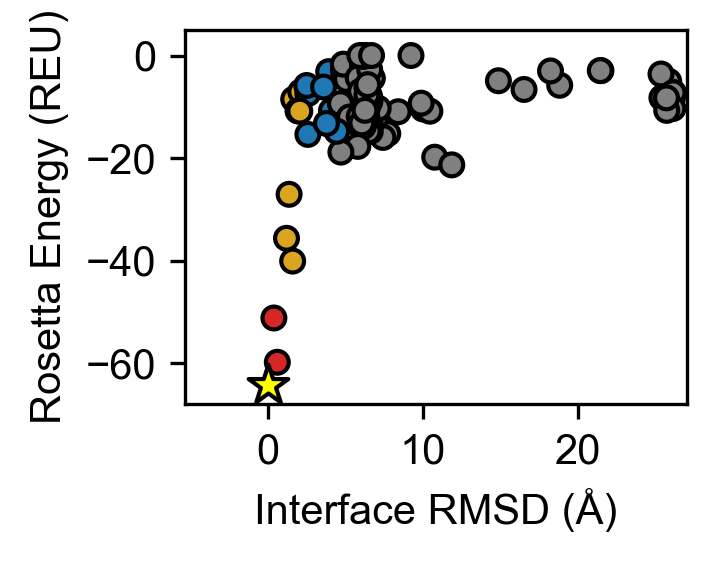

In [32]:
fig = plt.figure(figsize=(2.5, 2))
ax = fig.add_subplot(1, 1, 1)
_id = '1IRA'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.scatter(0.0, gt_results['rosetta'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1)
ax.set_xlabel('Interface RMSD (Å)')
ax.set_ylabel('Rosetta Energy (REU)')
# ax.set_xlim(0, 37)
ax.set_ylim(-68, 5)
xsta, xend = ax.get_xlim()
ax.set_xlim(min(xsta, -0.2), 27)
plt.tight_layout()
fig.set_dpi(300)
plt.savefig('1IRA_rosetta_v_rmsd.png', dpi=300, bbox_inches='tight')

In [33]:
import seaborn as sns
import pandas as pd

In [34]:
def dockq_category(dockq):
    if dockq < 0.23:
        return 'Incorrect'
    elif 0.23 <= dockq < 0.49:
        return 'Acceptable'
    elif 0.49 <= dockq < 0.80:
        return 'Medium'
    else:
        return 'High'

# Color palette
palette = {
    'Incorrect': 'gray',
    'Acceptable': 'tab:blue',
    'Medium': 'goldenrod',
    'High': 'tab:red'
}

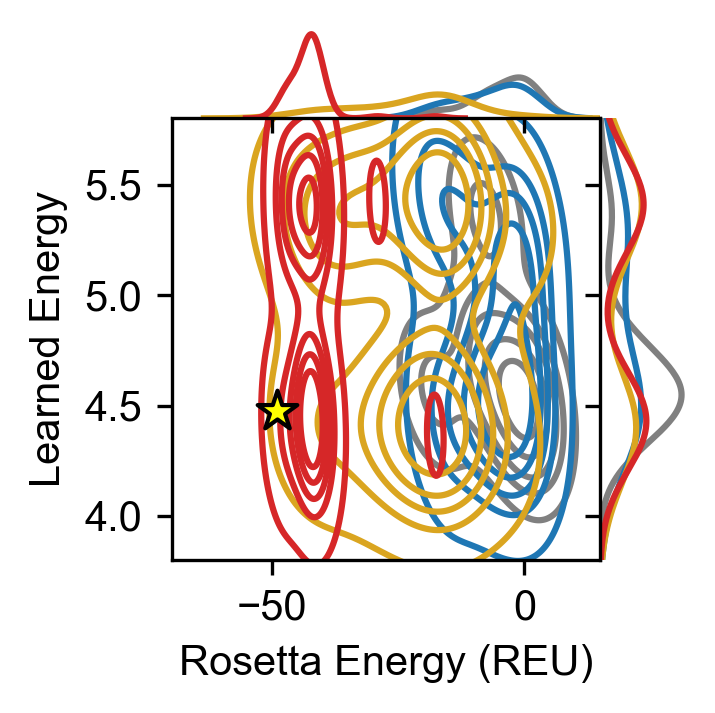

In [35]:
df = pd.DataFrame(results['2SIC'])
df = df[(df['rosetta_Isc'] > -10000) & (df['flowtime_nll'] < 5.5)]
df['DockQ_category'] = df['dockq'].apply(dockq_category)
df.rename(columns={
    'flowtime_nll': 'Learned Energy',
    'rosetta_Isc': 'Rosetta Energy (REU)'
}, inplace=True)
_id = '2SIC'

# Create joint KDE plot
g = sns.JointGrid(data=df, x='Rosetta Energy (REU)', y='Learned Energy', space=0, height=2.5)

for category in ['Incorrect', 'Acceptable', 'Medium', 'High']:
    subset = df[df['DockQ_category'] == category]
    if not subset.empty:
        sns.kdeplot(
            data=subset, x='Rosetta Energy (REU)', y='Learned Energy', ax=g.ax_joint,
            levels=6, color=palette[category], label=category
        )
        sns.kdeplot(
            data=subset, x='Rosetta Energy (REU)', ax=g.ax_marg_x, color=palette[category]
        )
        sns.kdeplot(
            data=subset, y='Learned Energy', ax=g.ax_marg_y, color=palette[category]
        )
g.ax_marg_x.set_xlim(-70, 15)
g.ax_marg_y.set_ylim(3.8, 5.8)
g.ax_joint.scatter(gt_results['rosetta'][_id], gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1, zorder=10)
plt.gcf().set_dpi(300)
plt.savefig('2SIC_flowtime_v_rosetta_kde.png', dpi=300, bbox_inches='tight')

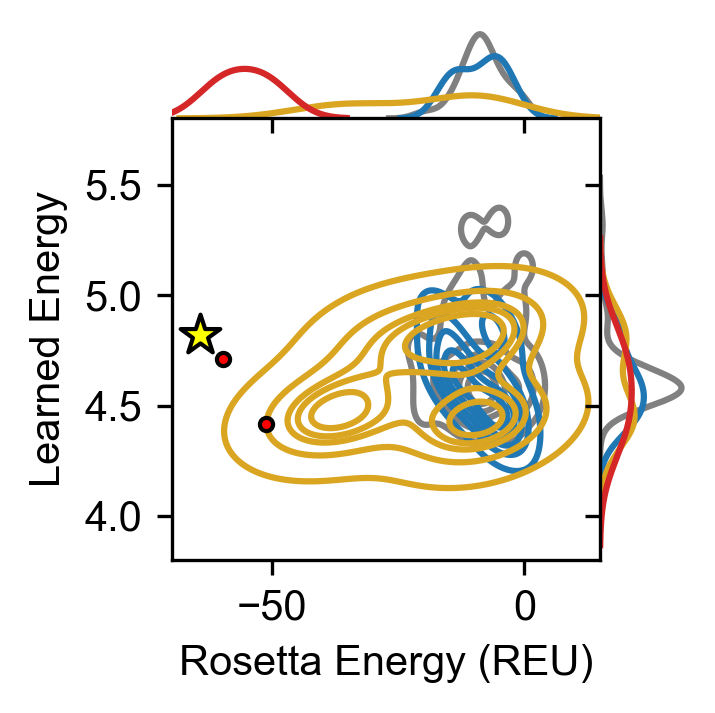

In [36]:
df = pd.DataFrame(results['1IRA'])
df = df[(df['rosetta_Isc'] > -10000) & (df['flowtime_nll'] < 5.5)]
df['DockQ_category'] = df['dockq'].apply(dockq_category)
df.rename(columns={
    'flowtime_nll': 'Learned Energy',
    'rosetta_Isc': 'Rosetta Energy (REU)'
}, inplace=True)
_id = '1IRA'

# Create joint KDE plot
g = sns.JointGrid(data=df, x='Rosetta Energy (REU)', y='Learned Energy', space=0, height=2.5)

for category in ['Incorrect', 'Acceptable', 'Medium', 'High']:
    subset = df[df['DockQ_category'] == category]
    if not subset.empty:
        if category == 'High':
            g.ax_joint.scatter(subset['Rosetta Energy (REU)'], subset['Learned Energy'], s=10, c='red', edgecolors='k', linewidths=1, zorder=10)
        else:
            sns.kdeplot(
                data=subset, x='Rosetta Energy (REU)', y='Learned Energy', ax=g.ax_joint,
                levels=6, color=palette[category], label=category
            )
        sns.kdeplot(
            data=subset, x='Rosetta Energy (REU)', ax=g.ax_marg_x, color=palette[category]
        )
        sns.kdeplot(
            data=subset, y='Learned Energy', ax=g.ax_marg_y, color=palette[category]
        )
g.ax_marg_x.set_xlim(-70, 15)
g.ax_marg_y.set_ylim(3.8, 5.8)
g.ax_joint.scatter(gt_results['rosetta'][_id], gt_results['flowtime'][_id], s=100, c='yellow', marker='*', edgecolors='k', linewidths=1, zorder=10)
plt.gcf().set_dpi(300)
plt.savefig('1IRA_flowtime_v_rosetta_kde.png', dpi=300, bbox_inches='tight')

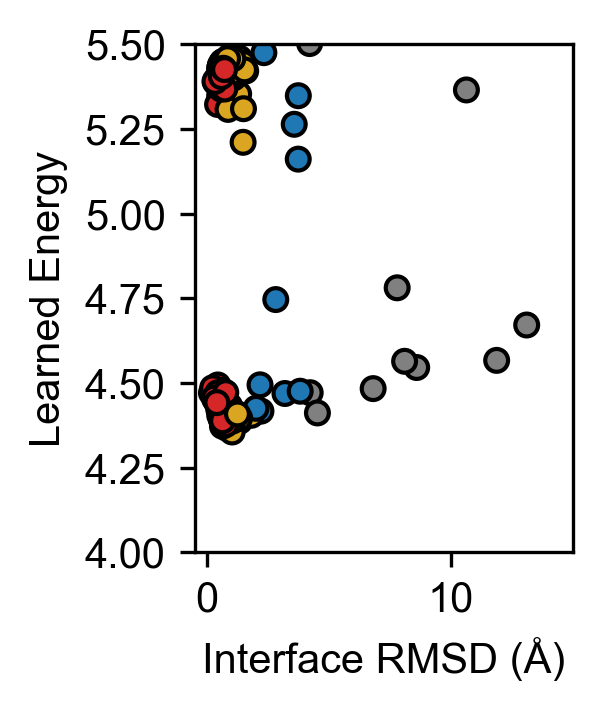

In [37]:
fig = plt.figure(figsize=(2.2, 2.5))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['flowtime_nll'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.set_xlabel('Interface RMSD (Å)')
ax.set_ylabel('Learned Energy')
# ax.set_ylabel('Learned Energy')
ax.set_xlim(0, 15)
ax.set_ylim(4, 5.5)
# ax.set_yticks([4.0, 4.5, 5.0, 5.5])
ax.set_xlim(left=-0.5)
# ax.set_ylim(2.3, 5)
plt.tight_layout()
fig.set_dpi(300)

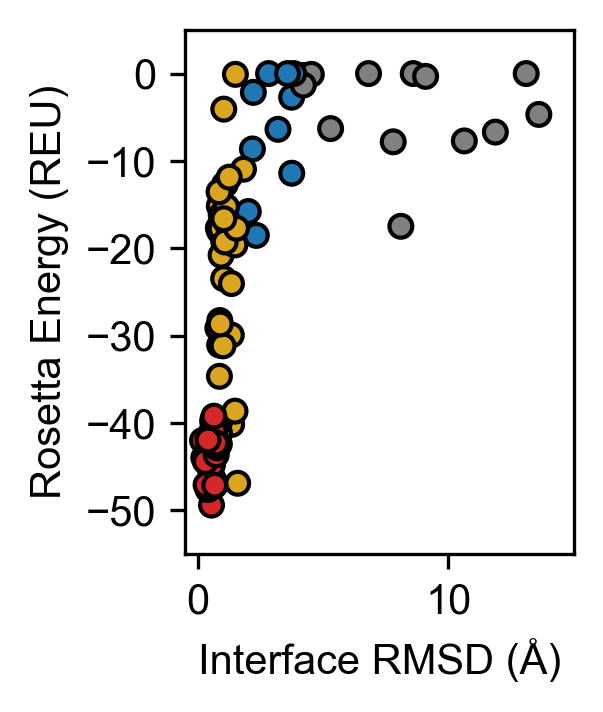

In [38]:
fig = plt.figure(figsize=(2.2, 2.5))
ax = fig.add_subplot(1, 1, 1)
_id = '2SIC'
idx_to_keep = results[_id]['rosetta_Isc'] > -10000
colors = ['gray' if dockq < 0.23 
            else 'tab:blue' if dockq < 0.49
            else 'goldenrod' if dockq < 0.80
            else 'tab:red' for dockq in results[_id]['dockq'][idx_to_keep]]
ax.scatter(results[_id]['i_rmsd'][idx_to_keep], results[_id]['rosetta_Isc'][idx_to_keep], s=30, edgecolors='k', linewidths=1, c=colors, label='DockQ')
ax.set_xlabel('Interface RMSD (Å)')
ax.set_ylabel('Rosetta Energy (REU)')
ax.set_xlim(0, 15)
ax.set_ylim(-55, 5)
ax.set_xlim(left=-0.5)
# ax.set_ylim(-55, 5)
plt.tight_layout()
fig.set_dpi(300)